## Purpose

Validate that the y vector generation in `build_A_matrix` by comparing it to FITS records.

The results of this notebook demonstrate that the y vector generation of `build_A_matrix` is correct.

In [1]:
%matplotlib widget

In [2]:
from pathlib import Path

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import sunpy.map
from PIL import Image

from scipy_io_util import loadmat

In [3]:
INSTR_RMIN = 1.6
INSTR_RMAX = 3.5

SCALE_FACTOR = 1e10

IMSIZE = 1024
BINNING_FACTOR = 4

M_IM = IMSIZE // BINNING_FACTOR

VMIN = 0
VMAX = 350

DIFF_MAX = 20

In [4]:
fts_path = Path('../data/cor1a1/')
DAY1 = 1
DAY2 = 14

fts_paths = [fts_path / f'200802{x:02d}_000500_1P4c1A.fts' for x in range(DAY1, DAY2 + 1)]

In [5]:
A_builda = loadmat('../tests/mat/A_gold_SolarTom_prelim.mat', squeeze_me=True)
A_build_A = loadmat('../tests/mat/A_gold_SolarTom_prelim_build_A.mat', squeeze_me=True)

In [6]:
assert len(A_builda['A_block_indptr']) == len(A_build_A['A_block_indptr']) == len(fts_paths) + 1 

In [7]:
for k in ['R_MAX', 'R_MIN', 'IMAGE_SIZE', 'BINNING_FACTOR']:
    assert A_builda[k] == A_build_A[k]

In [8]:
maps = [sunpy.map.Map(x) for x in fts_paths]

In [9]:
diff_cmap = matplotlib.cm.PiYG
diff_cmap.set_over('r')
diff_cmap.set_under('b')
diff_cmap.set_bad('k')

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Miss

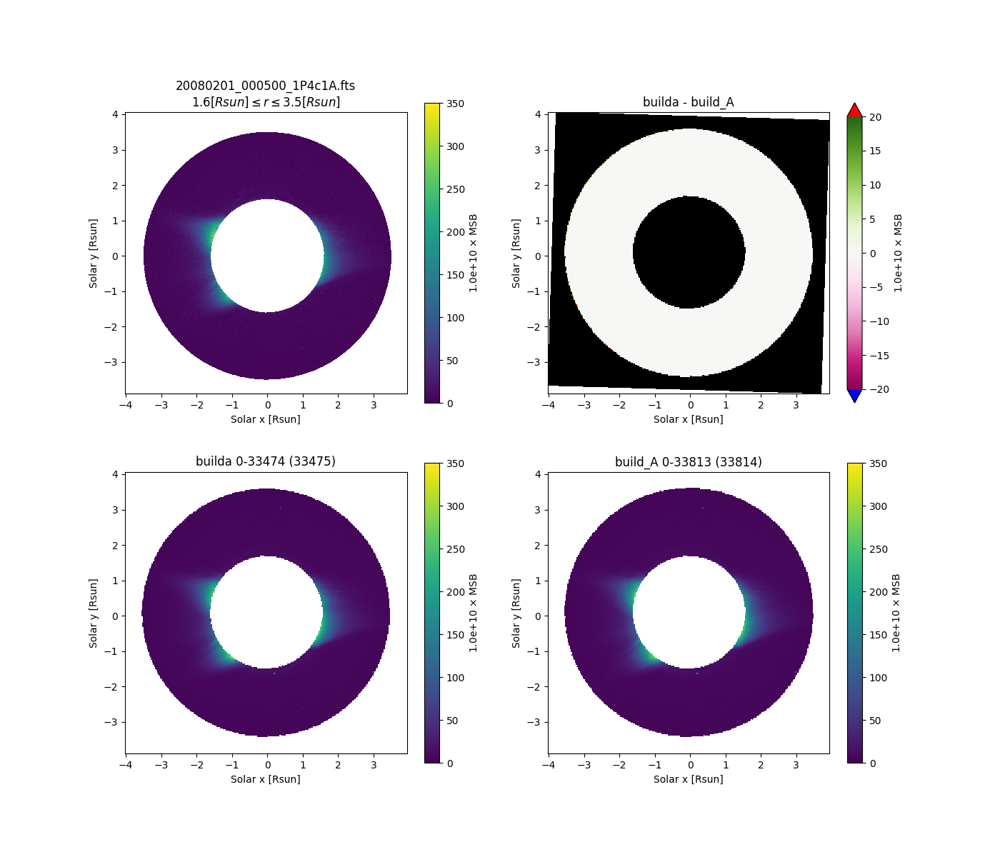

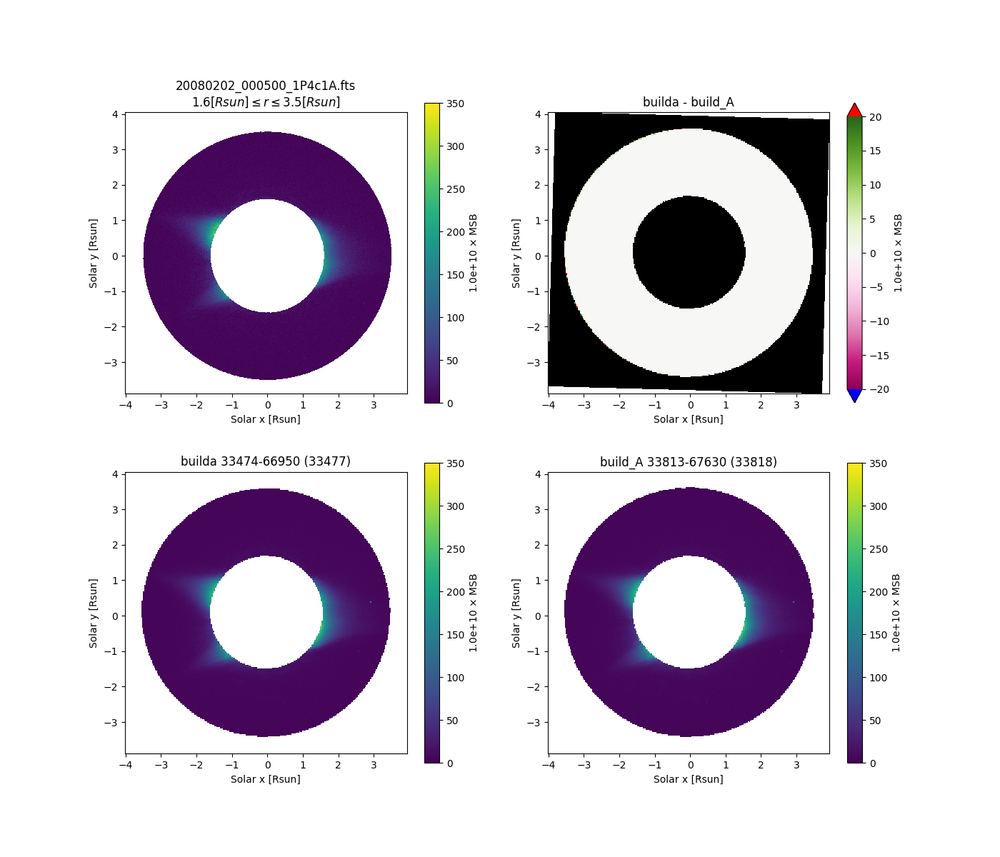

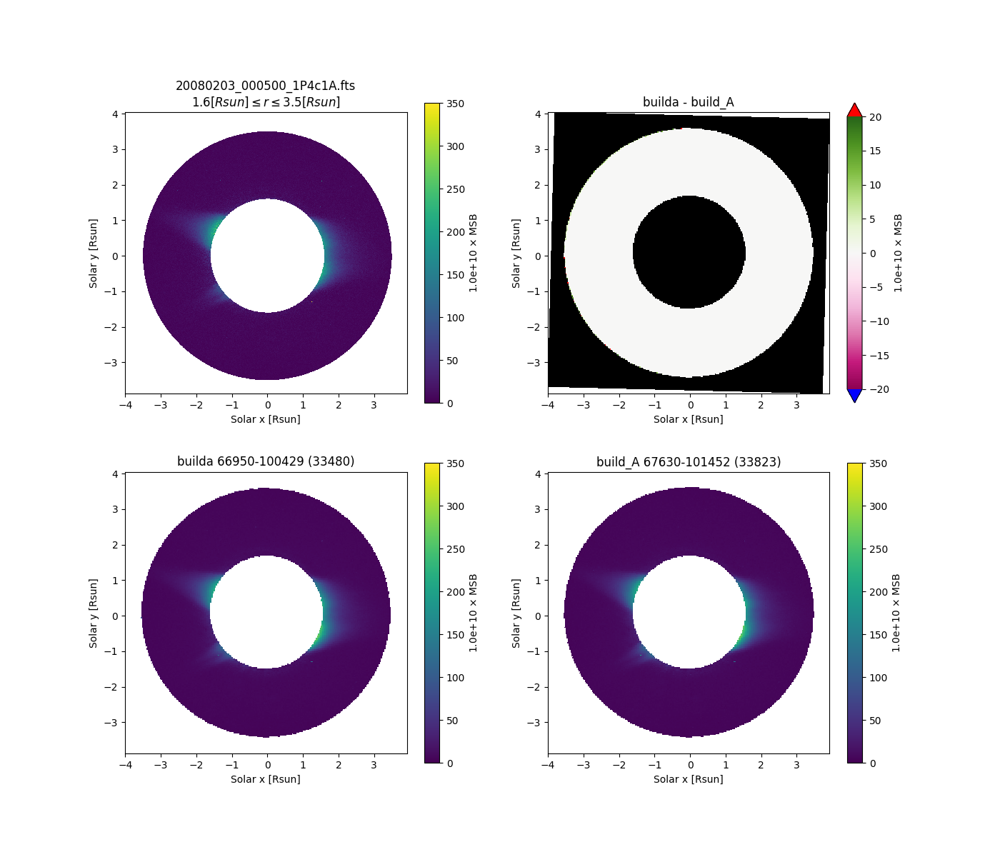

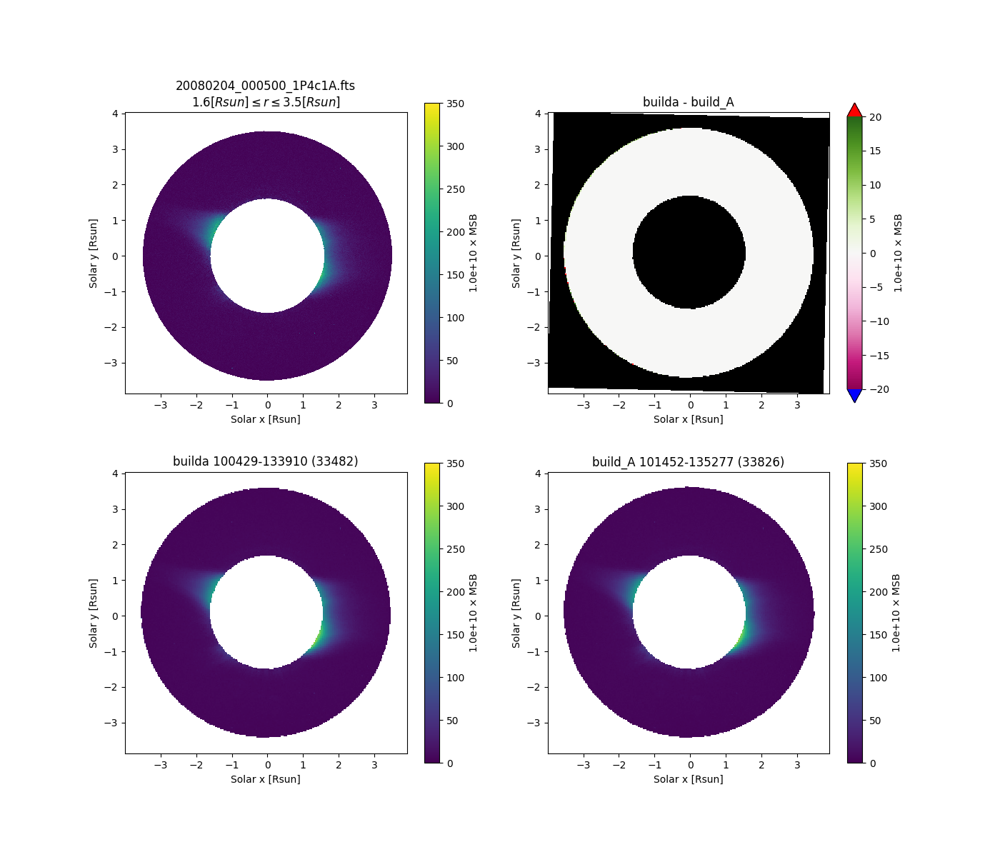

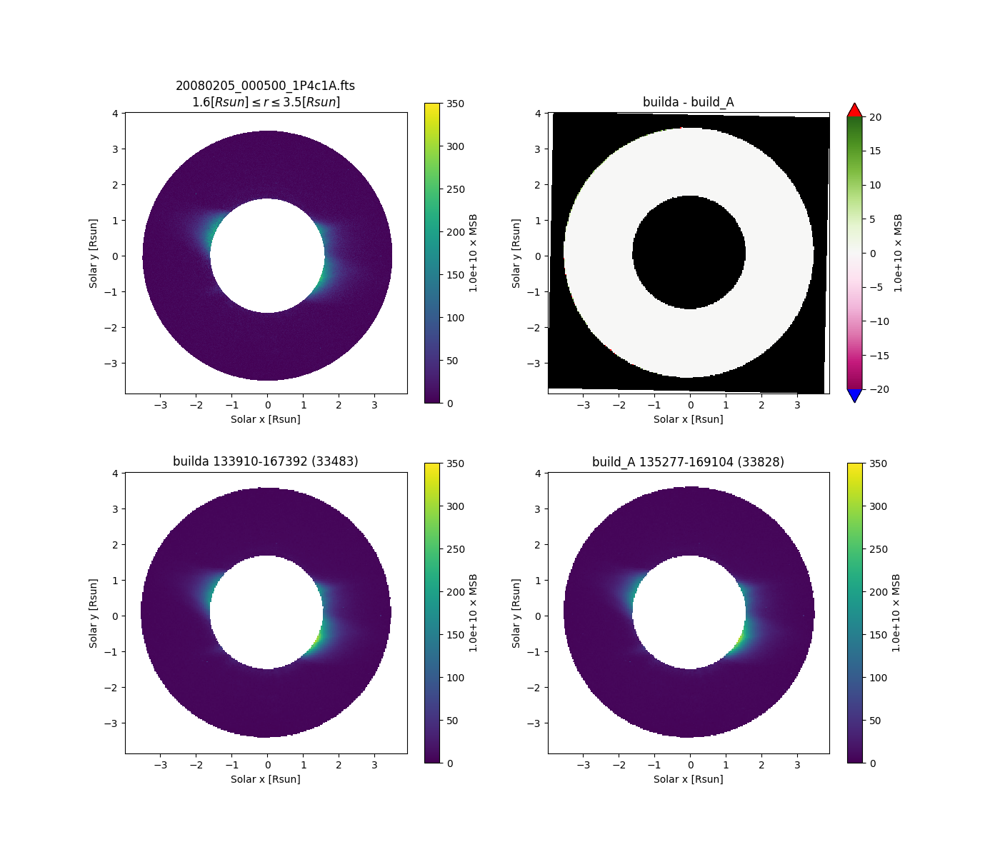

...

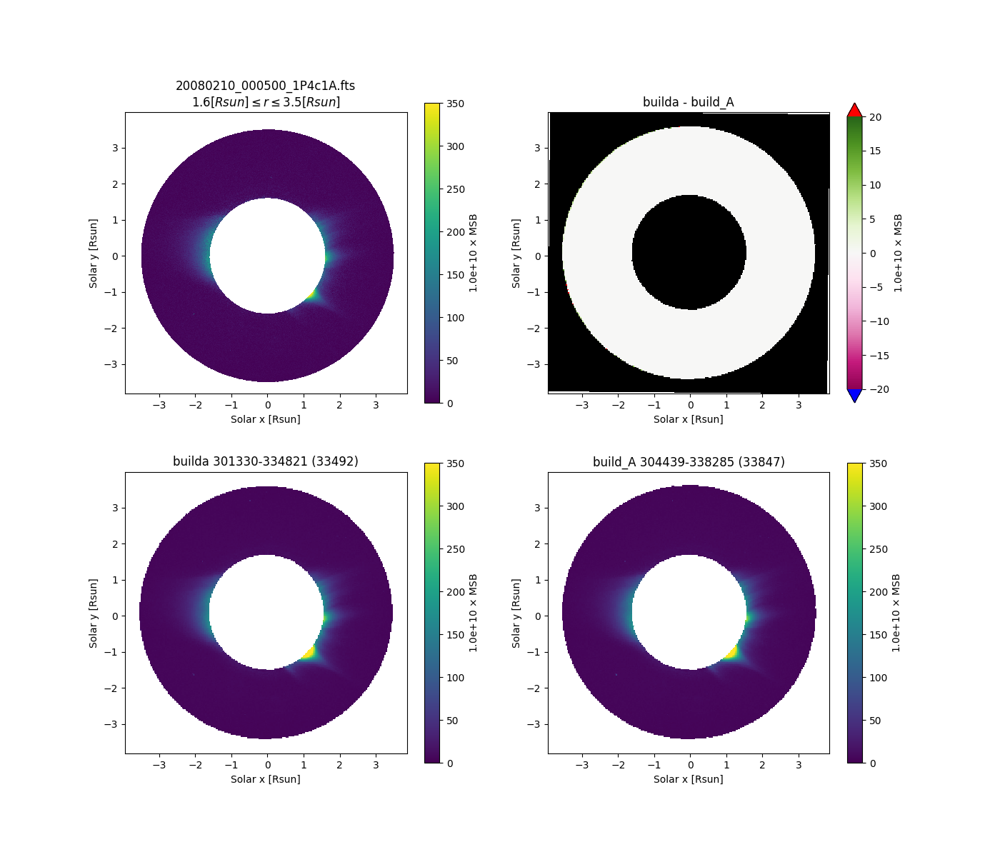

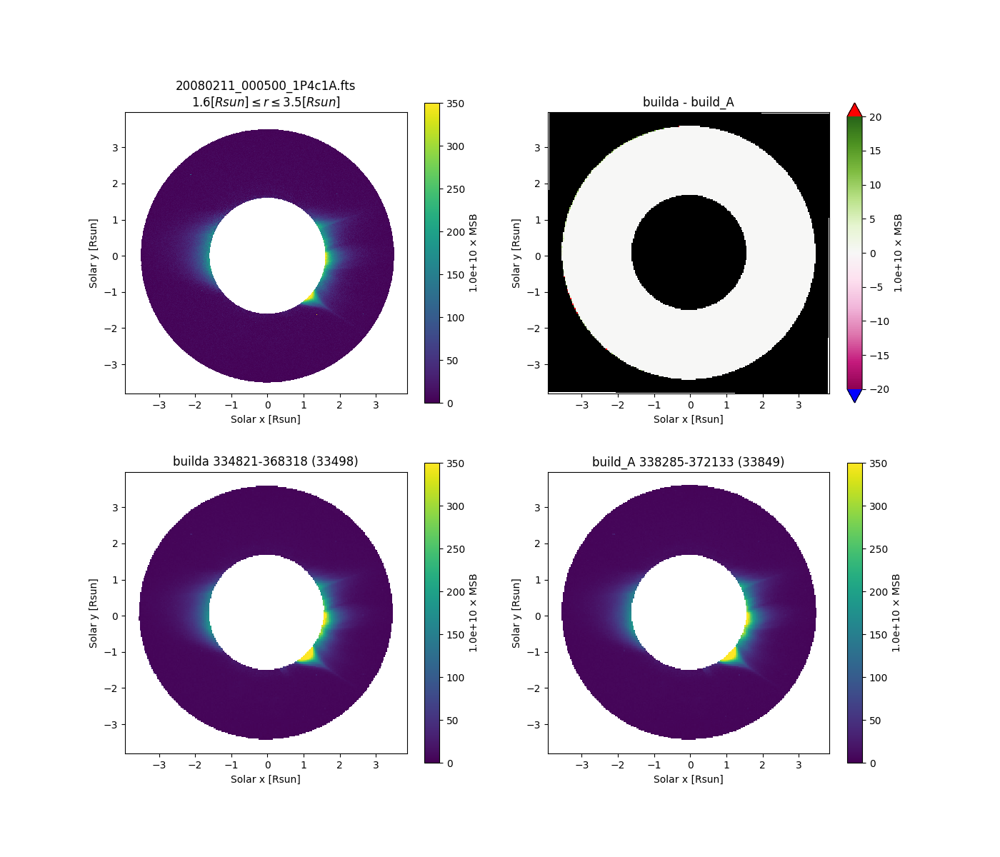

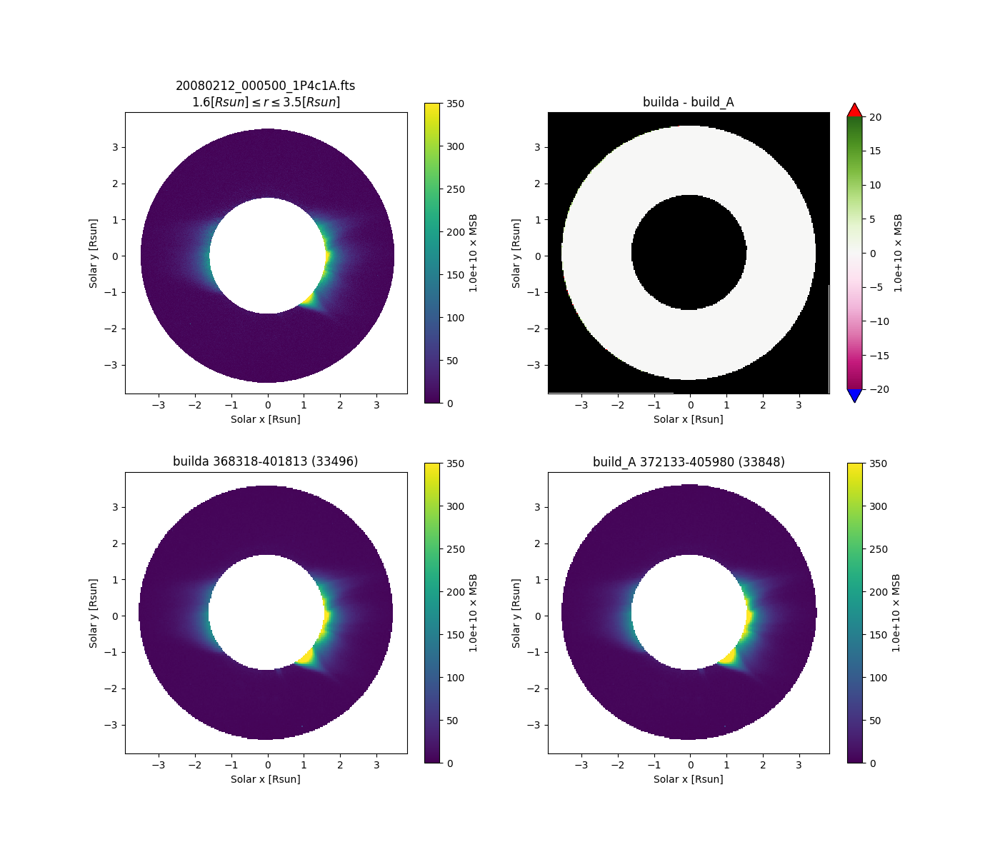

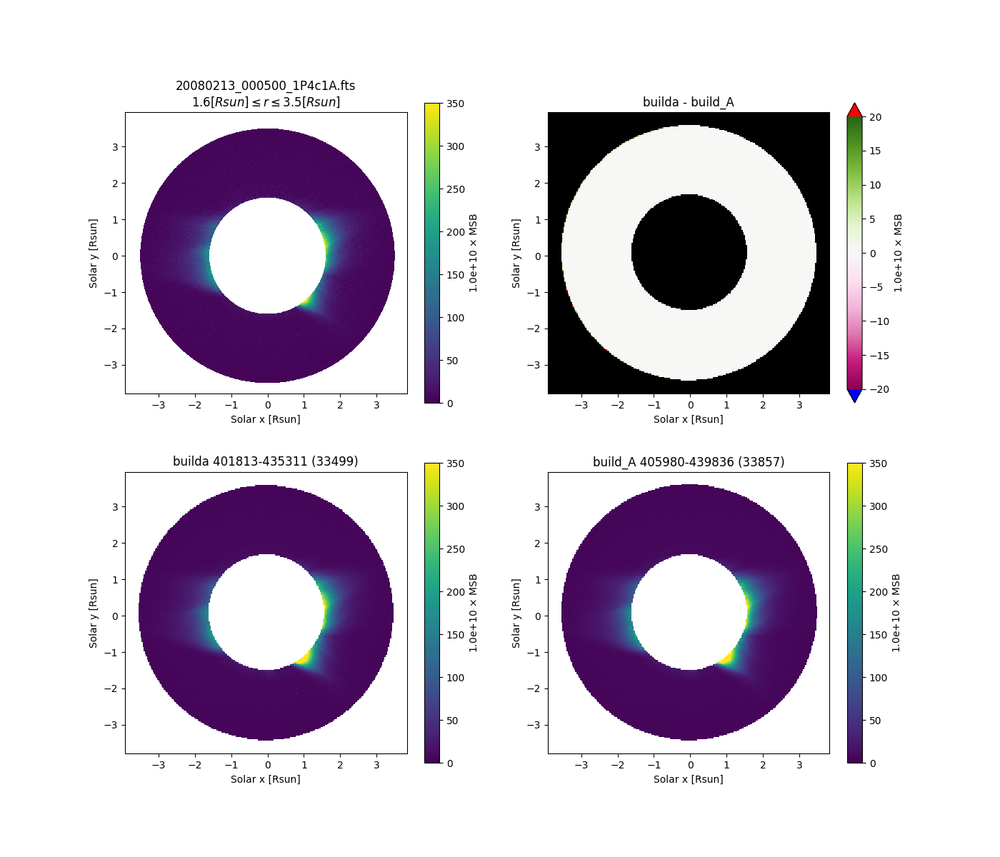

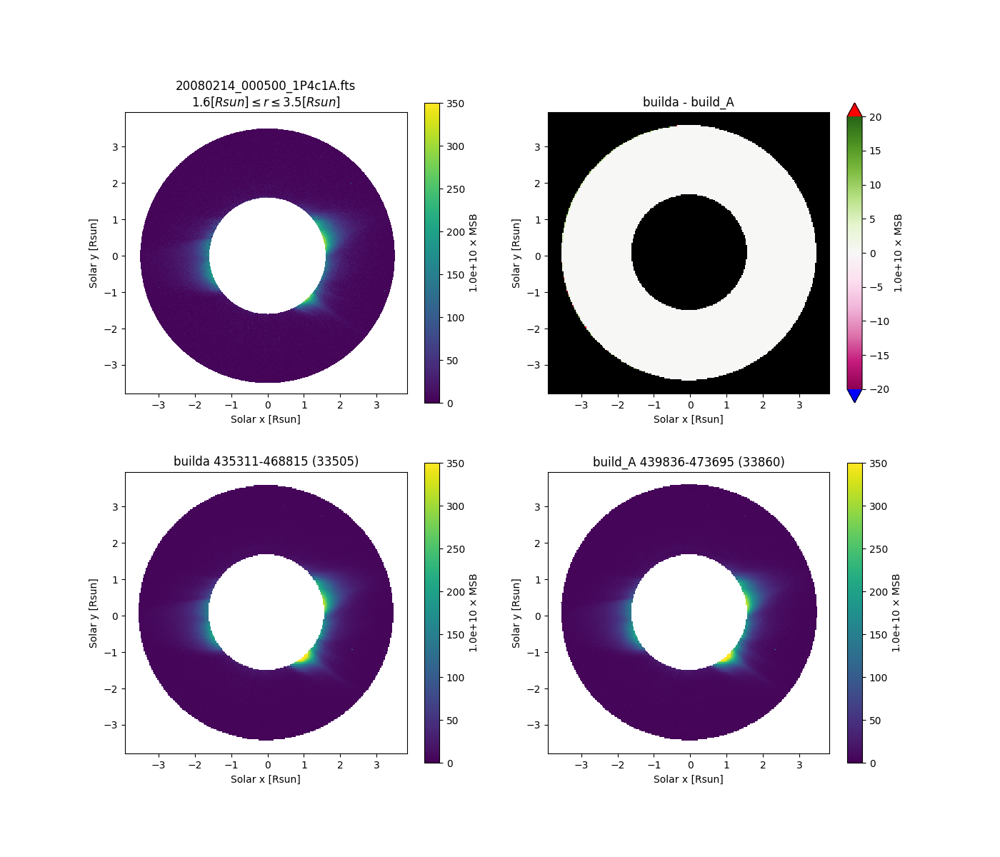

In [10]:
for i, map_i in enumerate(maps):
    centers = sunpy.map.all_coordinates_from_map(map_i)
    corners = sunpy.map.all_corner_coords_from_map(map_i)
    binned_corners = corners[::BINNING_FACTOR, ::BINNING_FACTOR]
    
    center_lon = np.array(centers.Tx)
    center_lat = np.array(centers.Ty)
    center_rad = np.sqrt(center_lon**2 + center_lat**2) 
    
    I = (center_rad < INSTR_RMIN * map_i.fits_header['RSUN']) | (center_rad > INSTR_RMAX * map_i.fits_header['RSUN'])

    data = map_i.data * SCALE_FACTOR
    data[I] = np.nan
    
    fig, ax = plt.subplots(figsize=(14,12), nrows=2, ncols=2,
                           subplot_kw={'aspect': 'equal'})
    im_fts = ax[0,0].pcolormesh(corners.Tx.arcsec / map_i.fits_header['RSUN'], 
                                corners.Ty.arcsec / map_i.fits_header['RSUN'], 
                                data, vmin=VMIN, vmax=VMAX)
    ax[0,0].set_xlabel('Solar x [Rsun]')        
    ax[0,0].set_ylabel('Solar y [Rsun]')
    ax[0,0].set_title(f'{fts_paths[i].name}\n${INSTR_RMIN} [Rsun] \\leq r \\leq {INSTR_RMAX}[Rsun]$')
    cb = fig.colorbar(im_fts, ax=ax[0,0])
    cb.set_label(f'{SCALE_FACTOR:.1e} $\\times$ MSB')

    builda = np.full((M_IM, M_IM), np.nan)
    I1_builda = A_builda['A_block_indptr'][i]
    I2_builda = A_builda['A_block_indptr'][i+1]
    I_idx_builda = slice(I1_builda, I2_builda)
    builda.flat[A_builda['y_idx'][I_idx_builda]] = A_builda['y'][I_idx_builda]

    build_A = np.full((M_IM, M_IM), np.nan)
    I1_build_A = A_build_A['A_block_indptr'][i]
    I2_build_A = A_build_A['A_block_indptr'][i+1]
    I_idx_build_A = slice(I1_build_A, I2_build_A)
    build_A.flat[A_build_A['y_idx'][I_idx_build_A]] = A_build_A['y'][I_idx_build_A] 

    im_build_diff = ax[0,1].pcolormesh(binned_corners.Tx.arcsec / map_i.fits_header['RSUN'],
                                       binned_corners.Ty.arcsec / map_i.fits_header['RSUN'],
                                       builda - build_A, vmin=-DIFF_MAX, vmax=DIFF_MAX, cmap=diff_cmap)
    ax[0,1].set_xlabel('Solar x [Rsun]')        
    ax[0,1].set_ylabel('Solar y [Rsun]')
    ax[0,1].set_title(f'builda - build_A')
    cb = fig.colorbar(im_build_diff, ax=ax[0,1], extend='both')
    cb.set_label(f'{SCALE_FACTOR:.1e} $\\times$ MSB')
    
    im_builda = ax[1,0].pcolormesh(binned_corners.Tx.arcsec / map_i.fits_header['RSUN'], 
                                   binned_corners.Ty.arcsec / map_i.fits_header['RSUN'], 
                                   builda, vmin=VMIN, vmax=VMAX)
    ax[1,0].set_xlabel('Solar x [Rsun]')        
    ax[1,0].set_ylabel('Solar y [Rsun]')
    ax[1,0].set_title(f'builda {I1_builda}-{I2_builda} ({I2_builda - I1_builda + 1})')
    cb = fig.colorbar(im_builda, ax=ax[1,0])
    cb.set_label(f'{SCALE_FACTOR:.1e} $\\times$ MSB')

    im_build_A = ax[1,1].pcolormesh(binned_corners.Tx.arcsec / map_i.fits_header['RSUN'], 
                                    binned_corners.Ty.arcsec / map_i.fits_header['RSUN'],
                                    build_A, vmin=VMIN, vmax=VMAX)
    ax[1,1].set_xlabel('Solar x [Rsun]')        
    ax[1,1].set_ylabel('Solar y [Rsun]')
    ax[1,1].set_title(f'build_A {I1_build_A}-{I2_build_A} ({I2_build_A - I1_build_A + 1})')
    cb = fig.colorbar(im_build_A, ax=ax[1,1])
    cb.set_label(f'{SCALE_FACTOR:.1e} $\\times$ MSB')

### Focus on one time index, comparing FITS and build_A

In [11]:
I = 10

In [12]:
image = Image.fromarray(maps[I].data)
binned_image = np.asarray(image.resize((M_IM, M_IM), resample=Image.Resampling.BOX)) * SCALE_FACTOR

In [13]:
build_A = np.full((M_IM, M_IM), np.nan)
I1_build_A = A_build_A['A_block_indptr'][I]
I2_build_A = A_build_A['A_block_indptr'][I+1]
I_idx_build_A = slice(I1_build_A, I2_build_A)
build_A.flat[A_build_A['y_idx'][I_idx_build_A]] = A_build_A['y'][I_idx_build_A] 

In [14]:
diff = binned_image - build_A

In [15]:
centers = sunpy.map.all_coordinates_from_map(maps[I])
corners = sunpy.map.all_corner_coords_from_map(maps[I])
binned_corners = corners[::BINNING_FACTOR, ::BINNING_FACTOR]

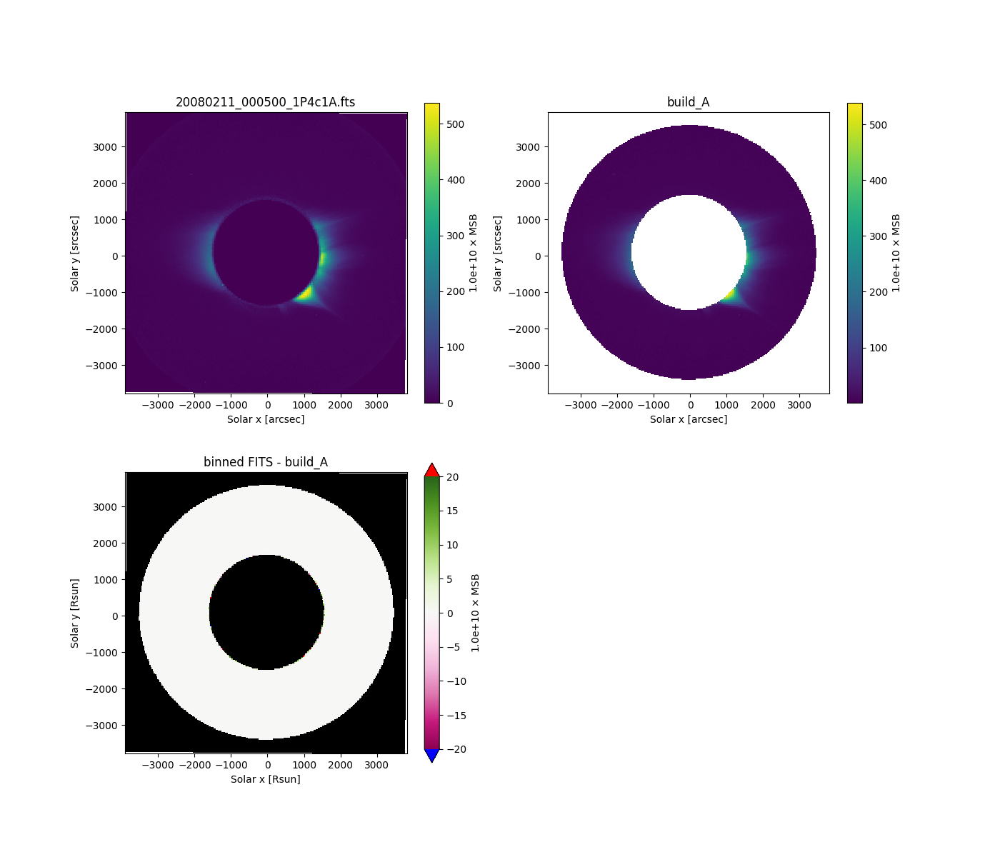

In [16]:
fig, ax = plt.subplots(figsize=(14, 12), nrows=2, ncols=2, subplot_kw={'aspect': 'equal'})

im0 = ax[0,0].pcolormesh(binned_corners.Tx, binned_corners.Ty, binned_image)
ax[0,0].set_xlabel('Solar x [arcsec]')
ax[0,0].set_ylabel('Solar y [srcsec]')
ax[0,0].set_title(f'{fts_paths[I].name}')
cb = fig.colorbar(im0, ax=ax[0,0])
cb.set_label(f'{SCALE_FACTOR:.1e} $\\times$ MSB')

im1 = ax[0,1].pcolormesh(binned_corners.Tx, binned_corners.Ty, build_A)
ax[0,1].set_xlabel('Solar x [arcsec]')
ax[0,1].set_ylabel('Solar y [srcsec]')
ax[0,1].set_title('build_A')
cb = fig.colorbar(im1, ax=ax[0,1])
cb.set_label(f'{SCALE_FACTOR:.1e} $\\times$ MSB')

im2 = ax[1,0].pcolormesh(binned_corners.Tx, binned_corners.Ty, diff,
                         vmin=-DIFF_MAX, vmax=DIFF_MAX, cmap=diff_cmap)
ax[1,0].set_xlabel('Solar x [Rsun]')        
ax[1,0].set_ylabel('Solar y [Rsun]')
ax[1,0].set_title(f'binned FITS - build_A')
cb = fig.colorbar(im2, ax=ax[1,0], extend='both')
cb.set_label(f'{SCALE_FACTOR:.1e} $\\times$ MSB')

#ax[1,1].set_aspect('auto')
#ax[1,1].hist(diff[diff != np.nan])
ax[1,1].set_axis_off()